In [1]:
import scirpy as ir

/home/kvalem/.conda/envs/tcr_2024/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import scanpy as sc

In [3]:
from glob import glob
import warnings
import tarfile

import anndata
import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc

In [4]:
import muon as mu

In [5]:
import numpy as np

In [6]:
samples = {
    "10mix1": {"group": "10mix"},
    "10mix2": {"group": "10mix"},
    "11mix1": {"group": "11mix"},
    "11mix2": {"group": "11mix"},
    "GF1": {"group": "GF"},
    "GF2": {"group": "GF"},

}    
    
# Create a list of AnnData objects (one for each sample)
adatas_tcr = {}
adatas_gex = {}
for sample, sample_meta in samples.items():
    adata_gex = sc.read_10x_h5(f"/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2019-10-29_sorted_cd8/analyses_icbi/{sample}/outs/per_sample_outs/{sample}/count/sample_filtered_feature_bc_matrix.h5")
    adata_tcr = ir.io.read_10x_vdj(f"/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2019-10-29_sorted_cd8/analyses_icbi/{sample}/outs/per_sample_outs/{sample}/vdj_t/filtered_contig_annotations.csv")
    # concatenation only works with unique gene names
    adata_gex.var_names_make_unique()
    adatas_tcr[sample] = adata_tcr
    adatas_gex[sample] = adata_gex

/home/kvalem/.conda/envs/tcr_2024/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/kvalem/.conda/envs/tcr_2024/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/kvalem/.conda/envs/tcr_2024/lib/python3.12/site-packages/anndata/utils.py:334: ExperimentalFeatureWarning: Support for Awkward Arrays is currently experimental. Behavior may change in the future. Please report any issues you may encounter!
  warnings.warn(msg, category, stacklevel=stacklevel)
/home/kvalem/.conda/envs/tcr_2024/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/kvalem/.conda

In [7]:
samples = {
    "10mix-ICI1": {"group": "10mix", "condition":"ICI"},
    "10mix-ICI2": {"group": "10mix","condition":"ICI"},
    "11mix-ICI1": {"group": "11mix","condition":"ICI"},
    "11mix-ICI2": {"group": "11mix","condition":"ICI"},
    "GF-ICI1": {"group": "GF","condition":"No ICI"},
    "GF-ICI2": {"group": "GF","condition":"No ICI"},
    "GF-ICI1-plus": {"group": "GF-plus","condition":"ICI"},
    "GF-ICI2-plus": {"group": "GF-plus","condition":"ICI"},


}    
    
# Create a list of AnnData objects (one for each sample)
adatas_tcr_2021 = {}
adatas_gex_2021 = {}
for sample, sample_meta in samples.items():
    adata_gex_2021 = sc.read_10x_h5(f"/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2021-02-01_sorted_cd8_til/analyses_icbi/{sample}/outs/per_sample_outs/{sample}/count/sample_filtered_feature_bc_matrix.h5")
    adata_tcr_2021 = ir.io.read_10x_vdj(f"/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2021-02-01_sorted_cd8_til/analyses_icbi/{sample}/outs/per_sample_outs/{sample}/vdj_t/filtered_contig_annotations.csv")
    # concatenation only works with unique gene names
    adata_gex_2021.var_names_make_unique()
    adatas_tcr_2021[sample] = adata_tcr_2021
    adatas_gex_2021[sample] = adata_gex_2021

/home/kvalem/.conda/envs/tcr_2024/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/kvalem/.conda/envs/tcr_2024/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/kvalem/.conda/envs/tcr_2024/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/kvalem/.conda/envs/tcr_2024/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/kvalem/.conda/envs/tcr_2024/lib/python3.12/site-packages/anndata/_core/anndata.py:1820

In [8]:
samples = {
    "10mix-ICI1": {"group": "10mix", "condition":"ICI"},
    "10mix-ICI2": {"group": "10mix","condition":"ICI"},
    "11mix-ICI1": {"group": "11mix","condition":"ICI"},
    "11mix-ICI2": {"group": "11mix","condition":"ICI"},
    "GF-ICI1": {"group": "GF","condition":"No ICI"},
    "GF-ICI2": {"group": "GF","condition":"No ICI"},
    "GF-ICI1-plus": {"group": "GF-plus","condition":"ICI"},
    "GF-ICI2-plus": {"group": "GF-plus","condition":"ICI"},
    "10mix1": {"group": "10mix", "condition":"naive"},
    "10mix2": {"group": "10mix", "condition":"naive"},
    "11mix1": {"group": "11mix", "condition":"naive"},
    "11mix2": {"group": "11mix", "condition":"naive"},
    "GF1": {"group": "GF", "condition":"naive"},
    "GF2": {"group": "GF", "condition":"naive"},
}    

In [9]:
# Merge anndata objects
adata_gex = anndata.concat(adatas_gex, index_unique="_")
adata_tcr = anndata.concat(adatas_tcr, index_unique="_")

In [10]:
# Merge anndata objects
adata_gex_2021 = anndata.concat(adatas_gex_2021, index_unique="_")
adata_tcr_2021 = anndata.concat(adatas_tcr_2021, index_unique="_")

In [11]:
adata_gex_merge = anndata.concat([adata_gex,adata_gex_2021], index_unique="_")
adata_tcr_merge = anndata.concat([adata_tcr,adata_tcr_2021], index_unique="_")

In [12]:
# Set global met'adata on `mdata.obs`
adata_gex_merge.obs["sample"] = adata_gex_merge.obs_names.to_series().str.split("_", expand=True)[1]
adata_gex_merge.obs["group"] = adata_gex_merge.obs["sample"].map(lambda x: samples[x]["group"])
adata_gex_merge.obs["condition"] = adata_gex_merge.obs["sample"].map(lambda x: samples[x]["condition"])

In [13]:
adata_gex_merge.obs

,sample,group,condition
AAACCTGAGTCTTGCA-1_10mix1_0,10mix1,10mix,naive
AAACCTGAGTTAAGTG-1_10mix1_0,10mix1,10mix,naive
AAACCTGCAGGATCGA-1_10mix1_0,10mix1,10mix,naive
AAACCTGCATAACCTG-1_10mix1_0,10mix1,10mix,naive
AAACCTGCATACCATG-1_10mix1_0,10mix1,10mix,naive
...,...,...,...
TTTGTCATCCCTTGCA-1_GF-ICI2-plus_1,GF-ICI2-plus,GF-plus,ICI
TTTGTCATCGTTGCCT-1_GF-ICI2-plus_1,GF-ICI2-plus,GF-plus,ICI
TTTGTCATCTAACTGG-1_GF-ICI2-plus_1,GF-ICI2-plus,GF-plus,ICI
TTTGTCATCTCTGTCG-1_GF-ICI2-plus_1,GF-ICI2-plus,GF-plus,ICI


In [14]:
adata_gex_merge.var

""
Xkr4
Gm1992
Gm19938
Gm37381
Rp1
...
AC124606.1
AC133095.2
AC133095.1
AC234645.1


In [15]:
adata_tcr_merge.obs

""
cell_id
AAACCTGAGTCTTGCA-1_10mix1_0
AAACCTGAGTTAAGTG-1_10mix1_0
AAACCTGCAGGATCGA-1_10mix1_0
AAACCTGCATACCATG-1_10mix1_0
AAACCTGCATTGAGCT-1_10mix1_0
...
TTTGTCATCCAGAGGA-1_GF-ICI2-plus_1
TTTGTCATCCCTTGCA-1_GF-ICI2-plus_1
TTTGTCATCTAACTGG-1_GF-ICI2-plus_1


In [16]:
adata_tcr_merge.var

""


In [17]:
sc.pp.neighbors(adata_gex, n_pcs=30)
sc.tl.umap(adata_gex)
sc.tl.leiden(adata_gex)

/home/kvalem/.conda/envs/tcr_2024/lib/python3.12/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 32285 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(
/tmp/ipykernel_166607/2163850787.py:3: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_gex)


In [21]:
adata_gex.obs

,leiden
AAACCTGAGTCTTGCA-1_10mix1,4
AAACCTGAGTTAAGTG-1_10mix1,8
AAACCTGCAGGATCGA-1_10mix1,13
AAACCTGCATAACCTG-1_10mix1,7
AAACCTGCATACCATG-1_10mix1,13
...,...
TTTGCGCTCGGTGTTA-1_GF2,3
TTTGTCAAGGCTAGCA-1_GF2,0
TTTGTCAAGTGCCAGA-1_GF2,2
TTTGTCAAGTTGTCGT-1_GF2,2


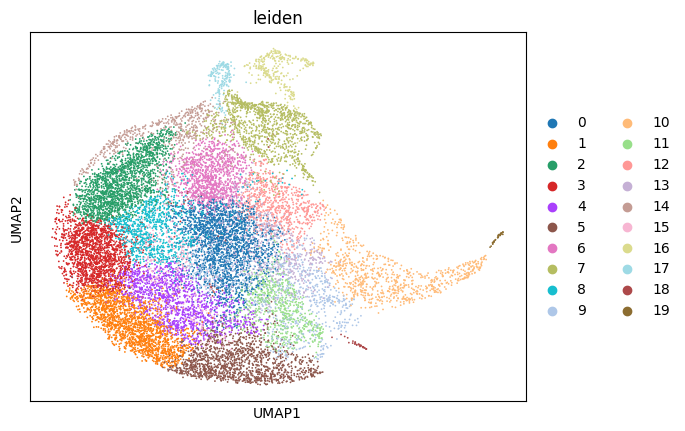

In [20]:
sc.pl.umap(adata_gex, color="leiden")

In [ ]:
mdata = mu.MuData({"gex": adata_gex_merge, "airr": adata_tcr_merge})

In [14]:
mdata

MuData object with n_obs × n_vars = 91098 × 32285
  2 modalities
    gex:	91098 x 32285
      obs:	'sample', 'group', 'condition'
    airr:	71512 x 0
      obsm:	'airr'

In [15]:
mdata_2019 = mu.MuData({"gex": adata_gex, "airr": adata_tcr})

In [16]:
mdata_2021 = mu.MuData({"gex": adata_gex_2021, "airr": adata_tcr_2021})

In [17]:
mdata.obs["sample"] = mdata.obs_names.to_series().str.split("_", expand=True)[1]

In [18]:
# Set global met'adata on `mdata.obs`
mdata.obs["sample"] = mdata.obs_names.to_series().str.split("_", expand=True)[1]
mdata.obs["group"] = mdata.obs["sample"].map(lambda x: samples[x]["group"])
mdata.obs["condition"] = mdata.obs["sample"].map(lambda x: samples[x]["condition"])

In [19]:
sc.pp.filter_genes(mdata["gex"], min_cells=10)
sc.pp.filter_cells(mdata["gex"], min_genes=100)

In [20]:
sc.pp.normalize_per_cell(mdata["gex"])
sc.pp.log1p(mdata["gex"])
sc.pp.highly_variable_genes(mdata["gex"], flavor="cell_ranger", n_top_genes=5000)
sc.tl.pca(mdata["gex"])
sc.pp.neighbors(mdata["gex"])

In [21]:
sc.tl.umap(mdata["gex"])

In [22]:
sc.tl.leiden(mdata["gex"])

In [23]:
mdata["gex"].var

,n_cells,highly_variable,means,dispersions,dispersions_norm
Xkr4,48,False,0.000368,0.874251,0.611840
Gm37381,13,True,0.000137,1.292408,2.855552
Rp1,11,True,0.000092,0.931653,0.823613
Mrpl15,32993,False,0.256465,0.570963,-1.141844
Lypla1,30447,False,0.234750,0.605432,-0.745319
...,...,...,...,...,...
AC132444.6,23,True,0.000185,0.937899,0.949452
Vamp7,11659,False,0.076372,0.664279,-0.829067
Tmlhe,1911,True,0.015779,0.917549,2.178245
CAAA01147332.1,30994,False,0.255126,0.619704,-0.581131


In [24]:
mdata["gex"].obs["sample"] = mdata["gex"].obs_names.to_series().str.split("_", expand=True)[1]
mdata["gex"].obs["group"] = mdata["gex"].obs["sample"].map(lambda x: samples[x]["group"])
mdata["gex"].obs["condition"] = mdata["gex"].obs["sample"].map(lambda x: samples[x]["condition"])

In [25]:
def update_columns(row):
   
    if "ICI" not in row['sample']:
        row['origin'] = "colon"
    else:
         row['origin'] = "til"
        
    return row

# Apply the function to each row in the DataFrame
mdata["gex"].obs= mdata["gex"].obs.apply(update_columns, axis=1)

In [26]:
mdata.update()

In [27]:
mu.pp.intersect_obs(mdata)

In [28]:
mdata

MuData object with n_obs × n_vars = 71512 × 18327
  obs:	'sample', 'group', 'condition'
  2 modalities
    gex:	71512 x 18327
      obs:	'sample', 'group', 'condition', 'n_genes', 'n_counts', 'leiden', 'origin'
      var:	'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
      uns:	'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden'
      obsm:	'X_pca', 'X_umap'
      varm:	'PCs'
      obsp:	'distances', 'connectivities'
    airr:	71512 x 0
      obsm:	'airr'

/home/kvalem/.conda/envs/scirpy_2023/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


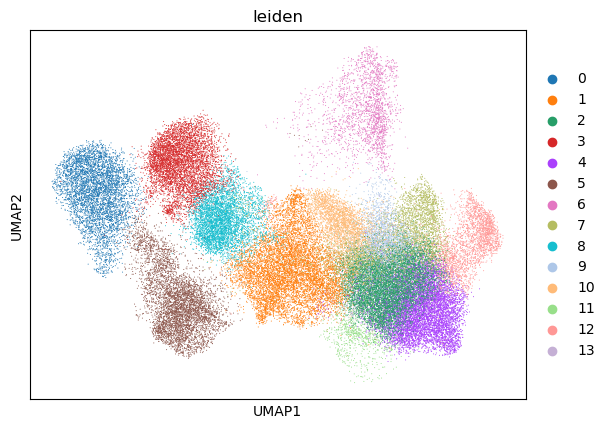

In [101]:
sc.pl.umap(mdata["gex"], color = "leiden")

/home/kvalem/.conda/envs/scirpy_2023/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/kvalem/.conda/envs/scirpy_2023/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


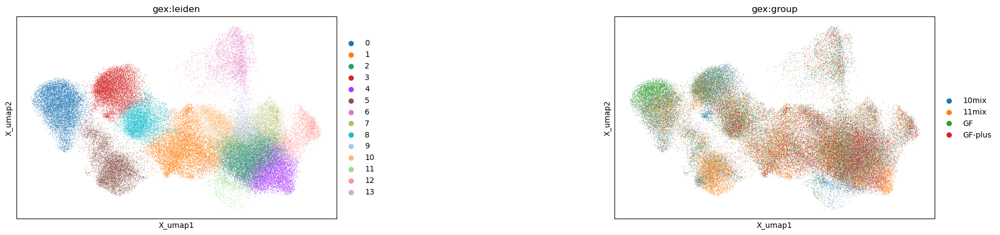

In [30]:
mu.pl.embedding(
    mdata,
    basis="gex:umap",
    color=["gex:leiden","gex:group"],
    ncols=3,
    wspace=0.7,
)


/home/kvalem/.conda/envs/scirpy_2023/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/kvalem/.conda/envs/scirpy_2023/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


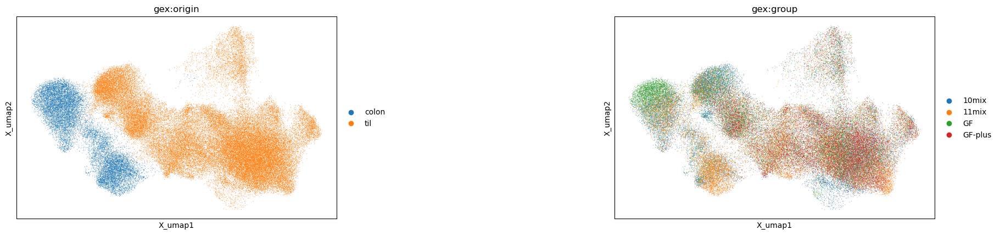

In [31]:
mu.pl.embedding(
    mdata,
    basis="gex:umap",
    color=["gex:origin","gex:group"],
    ncols=3,
    wspace=0.7,
)


In [32]:
#### cell annotation

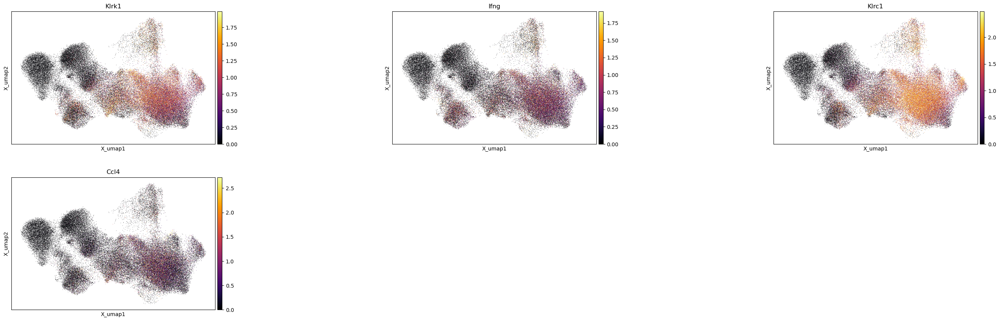

In [33]:
mu.pl.embedding(
    mdata,
    basis="gex:umap",
    color=["Klrk1","Ifng","Klrc1","Ccl4"],
    ncols=3,
    wspace=0.7,
    vmax= "p99",
    cmap ="inferno"
)


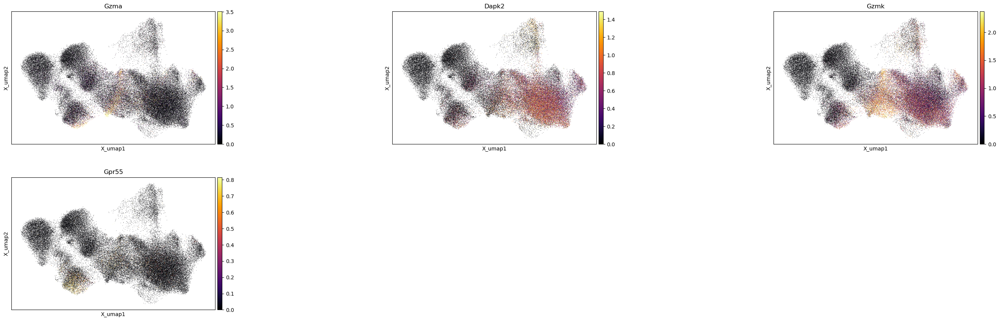

In [34]:
mu.pl.embedding(
    mdata,
    basis="gex:umap",
    color=["Gzma","Dapk2","Gzmk","Gpr55"],
    ncols=3,
    wspace=0.7,
    vmax= "p99",
    cmap ="inferno"
)


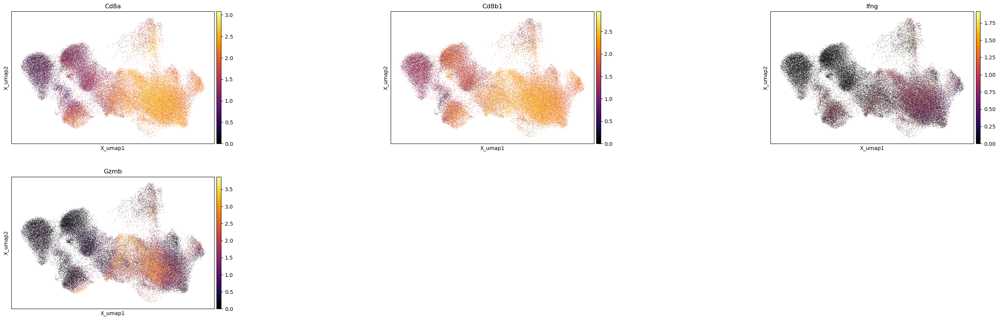

In [35]:
mu.pl.embedding(
    mdata,
    basis="gex:umap",
    color=["Cd8a","Cd8b1","Ifng","Gzmb"],
    ncols=3,
    wspace=0.7,
    vmax= "p99",
    cmap ="inferno"
)


/home/kvalem/.conda/envs/scirpy_2023/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


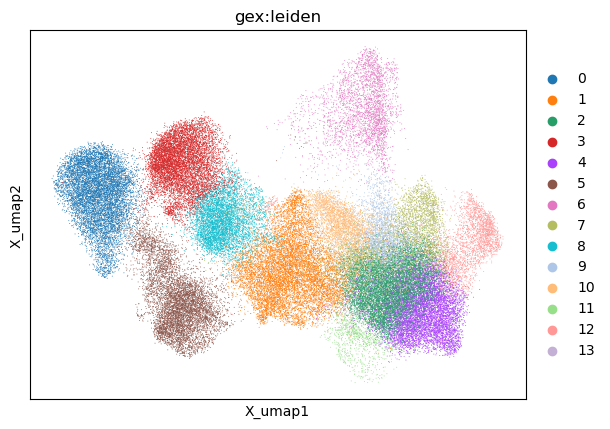

In [36]:
mu.pl.embedding(
    mdata,
    basis="gex:umap",
    color=["gex:leiden"],
    ncols=3,
    wspace=0.7,
)

In [37]:
# mitochondrial genes
mdata["gex"].var["mt"] = mdata.var_names.str.startswith("mt-")


In [38]:
sc.pp.calculate_qc_metrics(
    mdata["gex"], qc_vars=["mt"], inplace=True, percent_top=[20], log1p=True
)

In [39]:
mdata

MuData object with n_obs × n_vars = 71512 × 18327
  obs:	'sample', 'group', 'condition'
  2 modalities
    gex:	71512 x 18327
      obs:	'sample', 'group', 'condition', 'n_genes', 'n_counts', 'leiden', 'origin', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
      var:	'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
      uns:	'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'gex:leiden_colors', 'gex:group_colors', 'gex:origin_colors'
      obsm:	'X_pca', 'X_umap'
      varm:	'PCs'
      obsp:	'distances', 'connectivities'
    airr:	71512 x 0
      obsm:	'airr'

<Axes: title={'center': 'n_genes'}, xlabel='UMAP1', ylabel='UMAP2'>

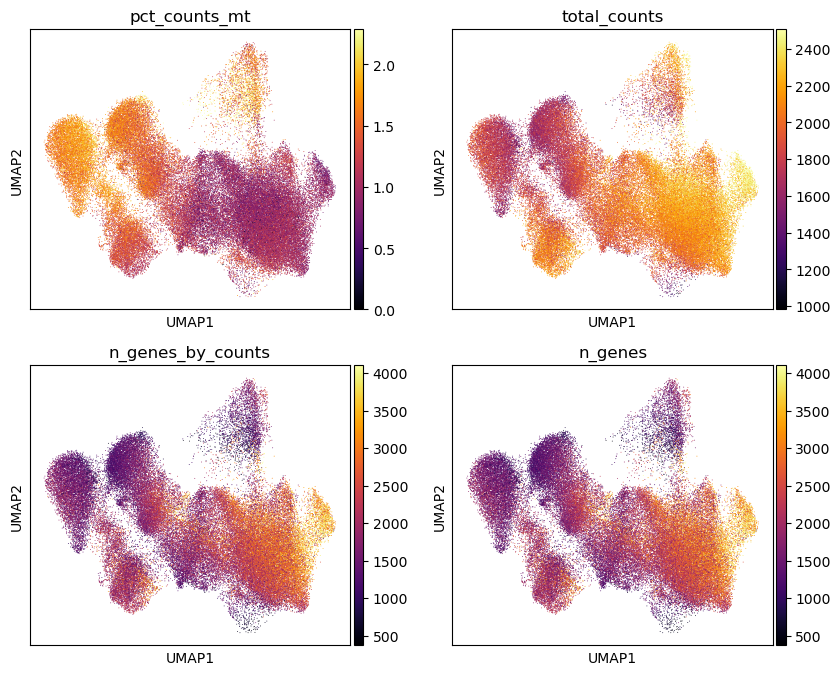

In [40]:
fig, axes = plt.subplots(2, 2, figsize=(10, 8))
axes=axes.flatten()
sc.pl.umap(
    mdata["gex"],
    color="pct_counts_mt",
    cmap="inferno",
    vmin=0,
    vmax="p99",
    sort_order=False,
    show=False,
    ax=axes[0],
)
sc.pl.umap(
    mdata["gex"],
    color="total_counts",
    cmap="inferno",
    vmax="p99",
    sort_order=False,
    show=False,
    ax=axes[1],
)
sc.pl.umap(
    mdata["gex"],
    color="n_genes_by_counts",
    cmap="inferno",
    vmax="p99",
    sort_order=False,
    show=False,
    ax=axes[2],
)
sc.pl.umap(
    mdata["gex"],
    color="n_genes",
    cmap="inferno",
    vmax="p99",
    sort_order=False,
    show=False,
    ax=axes[3],
)

In [41]:
def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M
    )
    return outlier

In [42]:

from scipy.stats import median_abs_deviation

In [43]:
mdata["gex"].obs["outlier"] = (
    is_outlier(mdata["gex"], "log1p_total_counts", 1)
    | is_outlier(mdata["gex"], "log1p_n_genes_by_counts", 1)
    | is_outlier(mdata["gex"], "pct_counts_in_top_20_genes",1)
)
mdata["gex"].obs.outlier.value_counts()

True     48521
False    22991
Name: outlier, dtype: int64

In [44]:
mdata_qc = mdata["gex"][(~mdata["gex"].obs.outlier)]

In [45]:
mdata_qc

View of AnnData object with n_obs × n_vars = 22991 × 18327
    obs: 'sample', 'group', 'condition', 'n_genes', 'n_counts', 'leiden', 'origin', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'outlier'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'gex:leiden_colors', 'gex:group_colors', 'gex:origin_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

<Axes: title={'center': 'n_genes'}, xlabel='UMAP1', ylabel='UMAP2'>

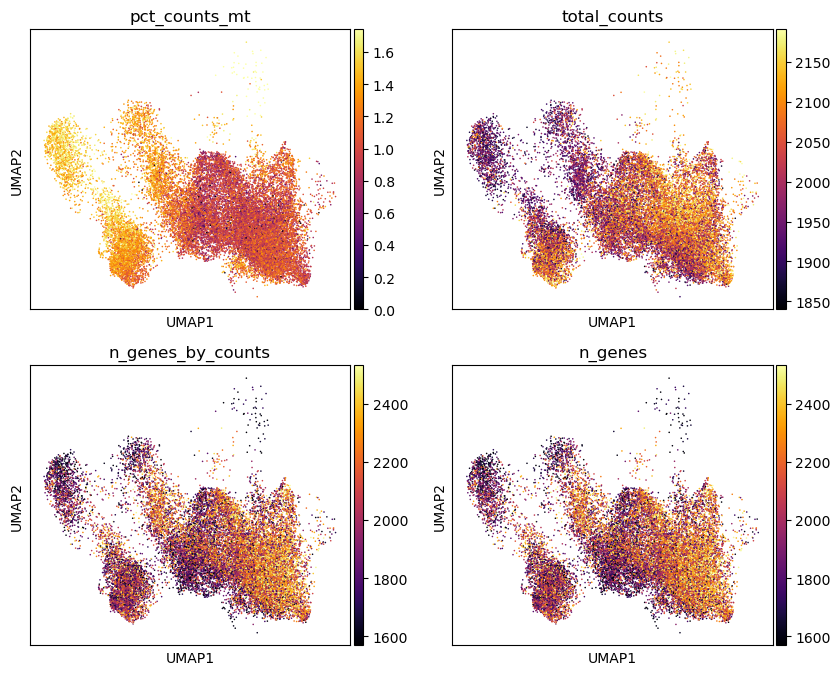

In [46]:
fig, axes = plt.subplots(2, 2, figsize=(10, 8))
axes=axes.flatten()
sc.pl.umap(
    mdata_qc,
    color="pct_counts_mt",
    cmap="inferno",
    vmin=0,
    vmax="p99",
    sort_order=False,
    show=False,
    ax=axes[0],
)
sc.pl.umap(
    mdata_qc,
    color="total_counts",
    cmap="inferno",
    vmax="p99",
    sort_order=False,
    show=False,
    ax=axes[1],
)
sc.pl.umap(
    mdata_qc,
    color="n_genes_by_counts",
    cmap="inferno",
    vmax="p99",
    sort_order=False,
    show=False,
    ax=axes[2],
)
sc.pl.umap(
    mdata_qc,
    color="n_genes",
    cmap="inferno",
    vmax="p99",
    sort_order=False,
    show=False,
    ax=axes[3],
)

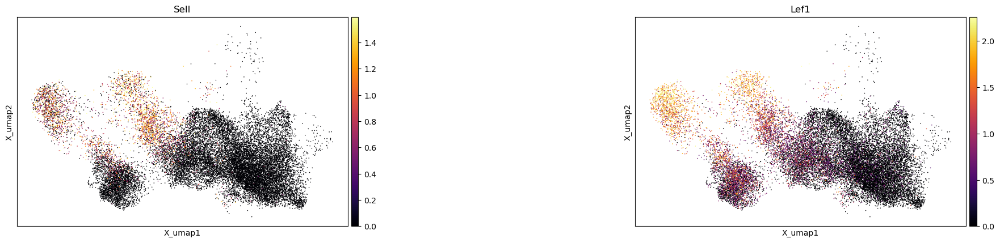

In [47]:
#naive
mu.pl.embedding(
    mdata_qc,
    basis="X_umap",
    color=["Sell","Lef1"],
    ncols=3,
    wspace=0.7,
    vmax= "p99",
    cmap ="inferno"
)

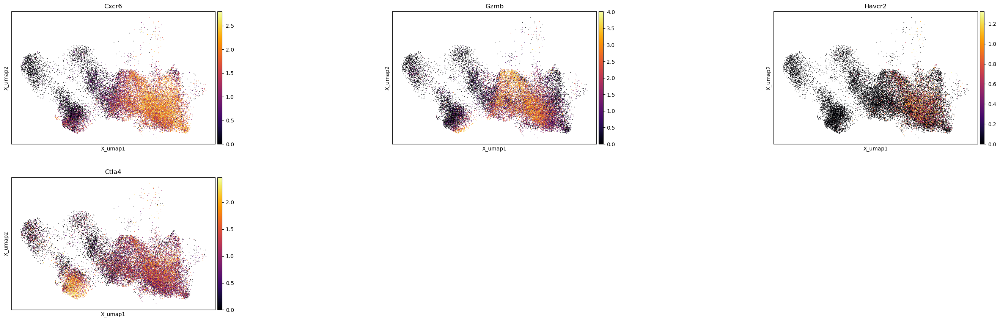

In [48]:
#ex
mu.pl.embedding(
    mdata_qc,
    basis="X_umap",
    color=[ "Cxcr6","Gzmb","Havcr2","Ctla4"],
    ncols=3,
    wspace=0.7,
    vmax= "p99",
    cmap ="inferno"
)

In [49]:
#9,13, 00,2,12,3,4,21,1,18,17 tex 
#11,8,5,16,10,6,7 tn

cl_annotation = { 
    "0": "Naive",
    "1": "Resident Memory",
    "3":"Naive",
    "4":"Exhausted",
    "5":"Exhausted",
    "7":"Exhausted",
    "8":"Naive",
    "10":"IFg",
    "11":"Exhausted",

}

In [50]:
mdata["gex"].obs["cell_type_coarse"] = mdata["gex"].obs.leiden.map(cl_annotation)

In [51]:
mdata_2019["gex"].obs["cell_type_coarse"] = mdata_2019["gex"].obs.leiden.map(cl_annotation)

AttributeError: 'DataFrame' object has no attribute 'leiden'

In [ ]:
mdata_2021["gex"].obs["cell_type_coarse"] = mdata_2021["gex"].obs.leiden.map(cl_annotation)

In [ ]:
mdata_2021.update()

In [ ]:
mdata_2019.update()

In [ ]:
mdata_qc.obs["cell_type_coarse"] = mdata_qc.obs.leiden.map(cl_annotation)

In [ ]:
naive - 0, 3,8
rm - 10,1
ex - 5,11,7,4
ifg - 

In [ ]:
mdata_qc = mdata_qc[mdata_qc.obs["cell_type_coarse"].isin(['Exhausted', 'Naive', 'Resident Memory'])]
                     

In [ ]:
mdata_qc.write_h5ad("mdata_qc.h5ad")

In [ ]:
set(mdata_qc.obs.cell_type_coarse)

In [ ]:
mu.pl.embedding(
      mdata_qc,
    basis="X_umap",
    color=["cell_type_coarse","origin"],
    ncols=3,
    wspace=0.7,
)

In [ ]:
mu.pl.embedding(
      mdata_qc,
    basis="X_umap",
    color=["cell_type_coarse"],
    ncols=3,
    wspace=0.7,
)

In [ ]:
#rm 


#ex
mu.pl.embedding(
    mdata_qc,
    basis="X_umap",
    color=["Jaml","Prf1","Gzmb"],
    ncols=3,
    wspace=0.7,
    vmax= "p99",
    cmap ="inferno"
)

In [ ]:
#ifg
mu.pl.embedding(
    mdata_qc,
    basis="X_umap",
    color=[ "Isg15","Ifit3","Ifit1","Stat1" ],
    ncols=3,
    wspace=0.7,
    vmax= "p99",
    cmap ="inferno"
)

In [ ]:
mdata.update()

In [ ]:
Tnaive - Ltb","Sell","Lef1","Nosip -- 3,8
Tex - Cxcr6","Gzmb","Havcr2","Ctla4"
Tsen - Plcg2","Igkc","Klrk1","Slamf7"
Tifn "Isg15","Ifit3","Ifit1","Stat1" 

In [ ]:
#naive
mu.pl.embedding(
    mdata_2021,
    basis="gex:umap",
    color=["Sell","Lef1"],
    ncols=3,
    wspace=0.7,
    vmax= "p99",
    cmap ="inferno"
)

In [ ]:
#rm
mu.pl.embedding(
    mdata_2021,
    basis="gex:umap",
    color=["Jaml","Prf1","Gzmb"],
    ncols=3,
    wspace=0.7,
    vmax= "p99",
    cmap ="inferno"
)

In [ ]:
#ex
mu.pl.embedding(
    mdata_2021,
    basis="gex:umap",
    color=[ "Cxcr6","Gzmb","Havcr2","Ctla4"],
    ncols=3,
    wspace=0.7,
    vmax= "p99",
    cmap ="inferno"
)

In [ ]:
#ifg
mu.pl.embedding(
    mdata_2021,
    basis="gex:umap",
    color=[ "Isg15","Ifit3","Ifit1","Stat1" ],
    ncols=3,
    wspace=0.7,
    vmax= "p99",
    cmap ="inferno"
)

In [ ]:
#ifg
mu.pl.embedding(
    mdata_2019,
    basis="gex:umap",
    color=[ "Isg15","Stat1","sample"],
    ncols=3,
    wspace=0.7,
    vmax= "p99",
    cmap ="inferno"
)

In [52]:
mdata

MuData object with n_obs × n_vars = 71512 × 18327
  obs:	'sample', 'group', 'condition'
  2 modalities
    gex:	71512 x 18327
      obs:	'sample', 'group', 'condition', 'n_genes', 'n_counts', 'leiden', 'origin', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'outlier', 'cell_type_coarse'
      var:	'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
      uns:	'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'gex:leiden_colors', 'gex:group_colors', 'gex:origin_colors'
      obsm:	'X_pca', 'X_umap'
      varm:	'PCs'
      obsp:	'distances', 'connectivities'
    airr:	71512 x 0
      obsm:	'airr'

In [53]:
ir.pp.index_chains(mdata)

100%|██████████| 15/15 [00:10<00:00,  1.48it/s]


In [54]:
mdata

MuData object with n_obs × n_vars = 71512 × 18327
  obs:	'sample', 'group', 'condition'
  2 modalities
    gex:	71512 x 18327
      obs:	'sample', 'group', 'condition', 'n_genes', 'n_counts', 'leiden', 'origin', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'outlier', 'cell_type_coarse'
      var:	'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
      uns:	'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'gex:leiden_colors', 'gex:group_colors', 'gex:origin_colors'
      obsm:	'X_pca', 'X_umap'
      varm:	'PCs'
      obsp:	'distances', 'connectivities'
    airr:	71512 x 0
      uns:	'chain_indices'
      obsm:	'airr', 'chain_indices'

In [55]:
ir.tl.chain_qc(mdata)

In [56]:
set(mdata.obs["gex:sample"])

{'10mix-ICI1',
 '10mix-ICI2',
 '10mix1',
 '10mix2',
 '11mix-ICI1',
 '11mix-ICI2',
 '11mix1',
 '11mix2',
 'GF-ICI1',
 'GF-ICI1-plus',
 'GF-ICI2',
 'GF-ICI2-plus',
 'GF1',
 'GF2'}

In [57]:
mdata_2019  = mdata[mdata.obs["gex:sample"].isin(['10mix1',
 '10mix2',
 '11mix1',
 '11mix2',
  'GF1',
 'GF2'])]

In [58]:
mdata_2021  = mdata[mdata.obs["gex:sample"].isin(['10mix-ICI1',
 '10mix-ICI2',
 '11mix-ICI1',
 '11mix-ICI2',
 'GF-ICI1',
 'GF-ICI1-plus',
 'GF-ICI2',
 'GF-ICI2-plus'])]

In [59]:
mdata_2019

View of MuData object with n_obs × n_vars = 15207 × 18327
  obs:	'sample', 'group', 'condition'
  2 modalities
    gex:	15207 x 18327
      obs:	'sample', 'group', 'condition', 'n_genes', 'n_counts', 'leiden', 'origin', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'outlier', 'cell_type_coarse'
      var:	'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
      uns:	'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'gex:leiden_colors', 'gex:group_colors', 'gex:origin_colors'
      obsm:	'X_pca', 'X_umap'
      varm:	'PCs'
      obsp:	'distances', 'connectivities'
    airr:	15207 x 0
      obs:	'receptor_type', 'receptor_subtype', 'chain_pairing'
      uns:	'chain_indices'
      obsm:	'airr', 'chain_indices'

In [60]:
mdata_2021

View of MuData object with n_obs × n_vars = 56305 × 18327
  obs:	'sample', 'group', 'condition'
  2 modalities
    gex:	56305 x 18327
      obs:	'sample', 'group', 'condition', 'n_genes', 'n_counts', 'leiden', 'origin', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'outlier', 'cell_type_coarse'
      var:	'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
      uns:	'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'gex:leiden_colors', 'gex:group_colors', 'gex:origin_colors'
      obsm:	'X_pca', 'X_umap'
      varm:	'PCs'
      obsp:	'distances', 'connectivities'
    airr:	56305 x 0
      obs:	'receptor_type', 'receptor_subtype', 'chain_pairing'
      uns:	'chain_indices'
      obsm:	'airr', 'chain_indices'

/home/kvalem/.conda/envs/scirpy_2023/lib/python3.10/site-packages/anndata/_core/anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/kvalem/.conda/envs/scirpy_2023/lib/python3.10/site-packages/anndata/_core/anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/kvalem/.conda/envs/scirpy_2023/lib/python3.10/site-packages/anndata/_core/anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/kvalem/.conda/envs/scirpy_2023/lib/python3.10/site-packages/anndata/_core/anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/kvalem/.conda/envs/scirpy_2023/lib/python3.10/site-packages/anndata/_core/anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute

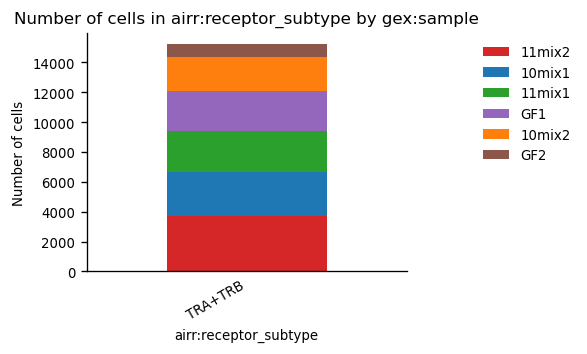

In [61]:
_ = ir.pl.group_abundance(mdata_2019, groupby="airr:receptor_subtype", target_col="gex:sample", )

/home/kvalem/.conda/envs/scirpy_2023/lib/python3.10/site-packages/anndata/_core/anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/kvalem/.conda/envs/scirpy_2023/lib/python3.10/site-packages/anndata/_core/anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/kvalem/.conda/envs/scirpy_2023/lib/python3.10/site-packages/anndata/_core/anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/kvalem/.conda/envs/scirpy_2023/lib/python3.10/site-packages/anndata/_core/anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/kvalem/.conda/envs/scirpy_2023/lib/python3.10/site-packages/anndata/_core/anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute

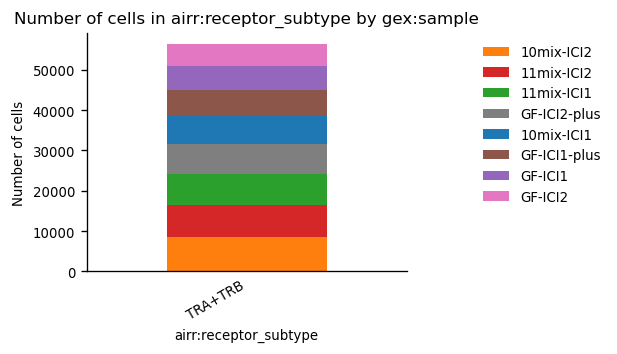

In [62]:
_ = ir.pl.group_abundance(mdata_2021, groupby="airr:receptor_subtype", target_col="gex:sample", )

In [63]:
mdata.update()

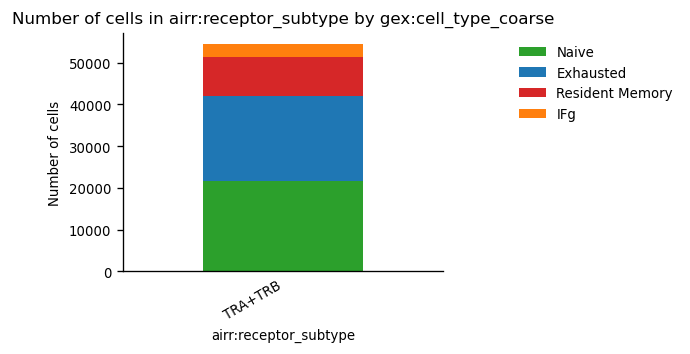

In [64]:
_ = ir.pl.group_abundance(mdata, groupby="airr:receptor_subtype", target_col="gex:cell_type_coarse", )

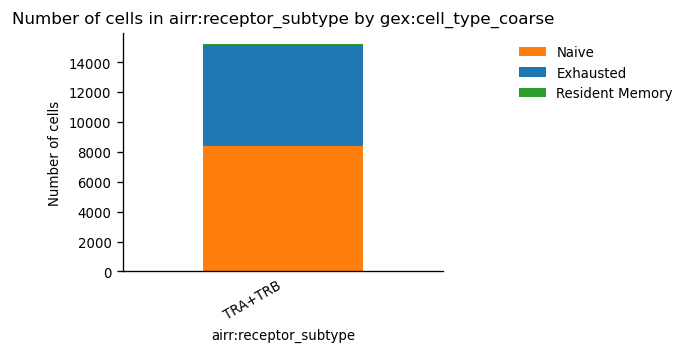

In [65]:
_ = ir.pl.group_abundance(mdata_2019, groupby="airr:receptor_subtype", target_col="gex:cell_type_coarse", )

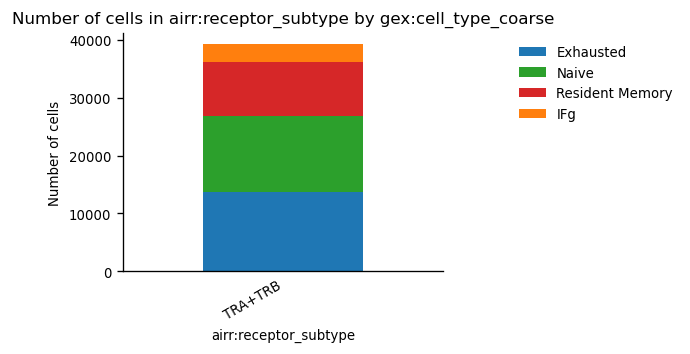

In [66]:
_ = ir.pl.group_abundance(mdata_2021, groupby="airr:receptor_subtype", target_col="gex:cell_type_coarse", )

In [67]:
mdata_qc.obs["cell_type_coarse"] = mdata_qc.obs.leiden.map(cl_annotation)

/tmp/ipykernel_26623/3152899185.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_qc.obs["cell_type_coarse"] = mdata_qc.obs.leiden.map(cl_annotation)


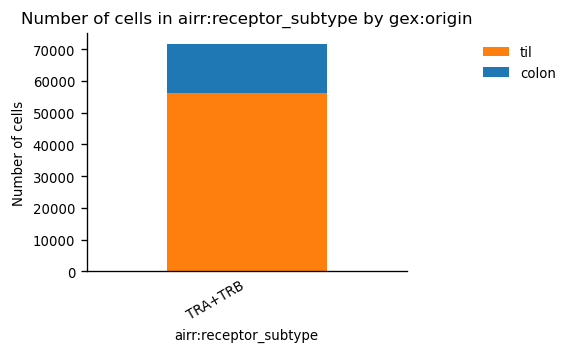

In [68]:
_ = ir.pl.group_abundance(mdata, groupby="airr:receptor_subtype", target_col="gex:origin")

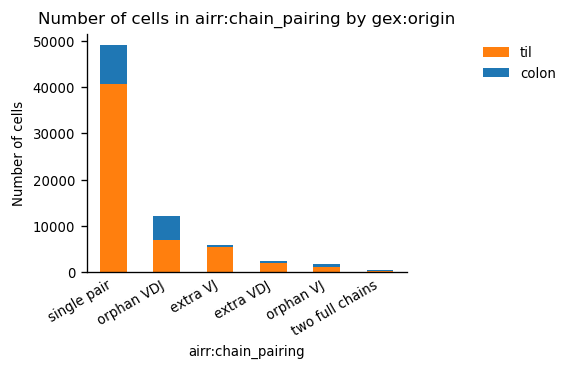

In [69]:
_ = ir.pl.group_abundance(mdata, groupby="airr:chain_pairing", target_col="gex:origin")

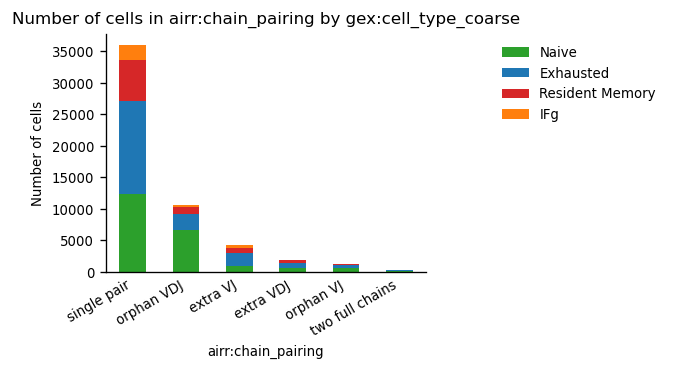

In [70]:
_ = ir.pl.group_abundance(mdata, groupby="airr:chain_pairing", target_col="gex:cell_type_coarse")

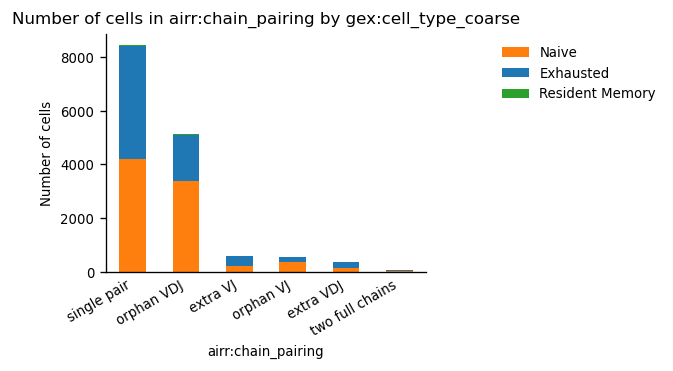

In [71]:
_ = ir.pl.group_abundance(mdata_2019, groupby="airr:chain_pairing", target_col="gex:cell_type_coarse")

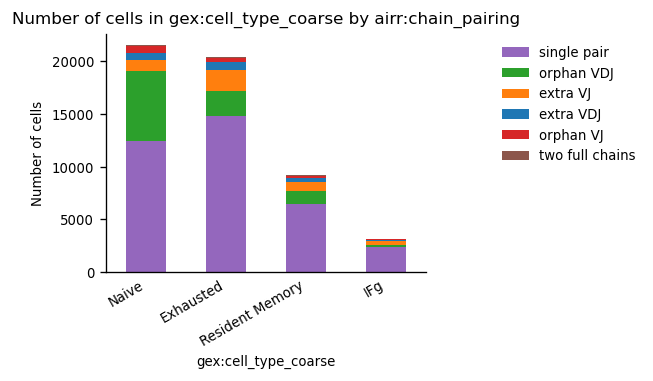

In [72]:
_ = ir.pl.group_abundance(mdata, groupby="gex:cell_type_coarse", target_col="airr:chain_pairing")

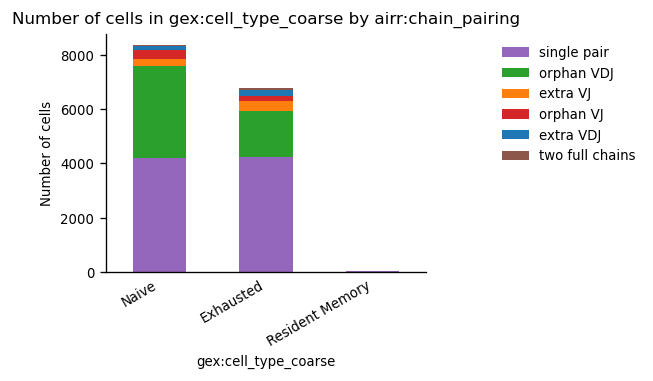

In [73]:
_ = ir.pl.group_abundance(mdata_2019, groupby="gex:cell_type_coarse", target_col="airr:chain_pairing")

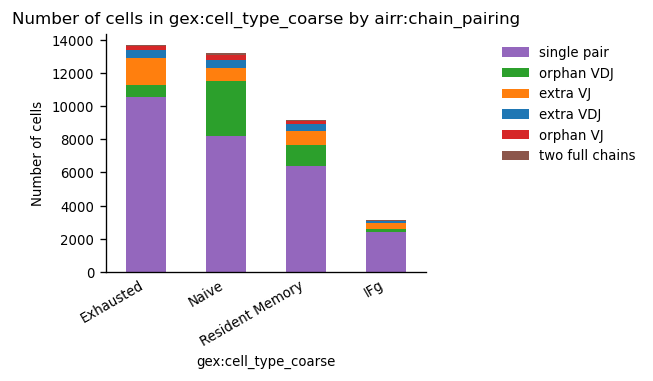

In [74]:
_ = ir.pl.group_abundance(mdata_2021, groupby="gex:cell_type_coarse", target_col="airr:chain_pairing")

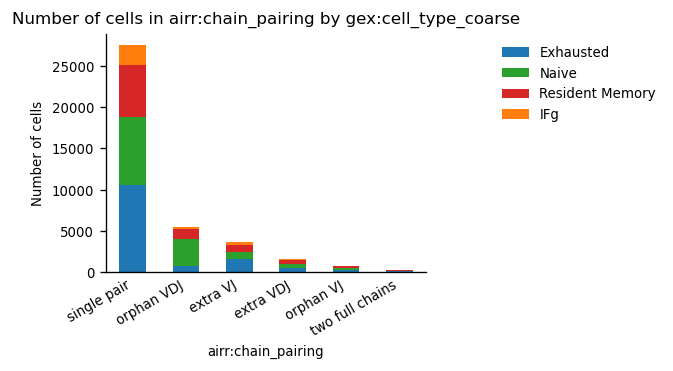

In [75]:
_ = ir.pl.group_abundance(mdata_2021, groupby="airr:chain_pairing", target_col="gex:cell_type_coarse")

In [76]:
print(
    "Fraction of cells with more than one pair of TCRs: {:.2f}".format(
        np.sum(mdata.obs["airr:chain_pairing"].isin(["extra VJ", "extra VDJ", "two full chains", "multichain"]))
        / mdata["airr"].n_obs
    )
)

Fraction of cells with more than one pair of TCRs: 0.12


/home/kvalem/.conda/envs/scirpy_2023/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


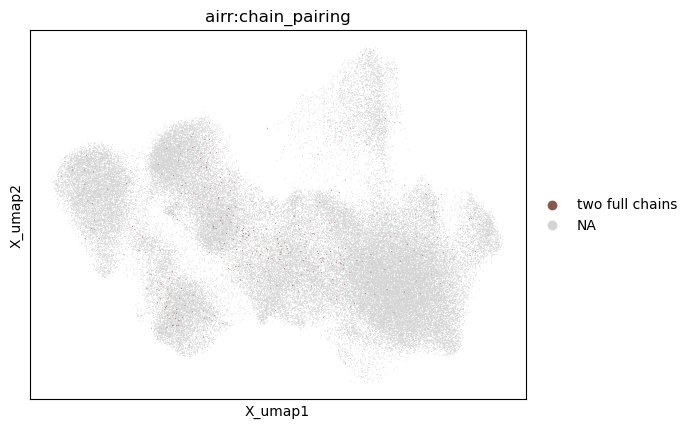

In [77]:
mu.pl.embedding(mdata, basis="gex:umap", color="airr:chain_pairing", groups="two full chains")

In [78]:
#mu.pp.filter_obs(mdata, "airr:chain_pairing", lambda x: x != "two full chains")

In [79]:
import numpy as np

In [80]:
mu.pp.filter_obs(mdata, "airr:chain_pairing", lambda x: ~np.isin(x, ["orphan VDJ", "orphan VJ"]))

In [81]:
mu.pp.filter_obs(mdata_2019, "airr:chain_pairing", lambda x: ~np.isin(x, ["orphan VDJ", "orphan VJ"]))

In [82]:
mu.pp.filter_obs(mdata_2021, "airr:chain_pairing", lambda x: ~np.isin(x, ["orphan VDJ", "orphan VJ"]))

In [83]:
mdata["gex"].var

,n_cells,highly_variable,means,dispersions,dispersions_norm,mt,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts
Xkr4,48,False,0.000368,0.874251,0.611840,False,37,0.000354,0.000353,99.948260,25.283474,3.268940
Gm37381,13,True,0.000137,1.292408,2.855552,False,11,0.000116,0.000116,99.984618,8.330776,2.233318
Rp1,11,True,0.000092,0.931653,0.823613,False,8,0.000077,0.000077,99.988813,5.489031,1.870113
Mrpl15,32993,False,0.256465,0.570963,-1.141844,False,27184,0.269625,0.238722,61.986799,19281.437500,9.866950
Lypla1,30447,False,0.234750,0.605432,-0.745319,False,24990,0.244304,0.218577,65.054816,17470.714844,9.768338
...,...,...,...,...,...,...,...,...,...,...,...,...
AC132444.6,23,True,0.000185,0.937899,0.949452,False,18,0.000196,0.000195,99.974829,13.981025,2.706784
Vamp7,11659,False,0.076372,0.664279,-0.829067,False,9380,0.079260,0.076276,86.883320,5668.029297,8.642774
Tmlhe,1911,True,0.015779,0.917549,2.178245,False,1475,0.014879,0.014769,97.937409,1063.997803,6.970728
CAAA01147332.1,30994,False,0.255126,0.619704,-0.581131,False,25001,0.259274,0.230535,65.039434,18541.173828,9.827803


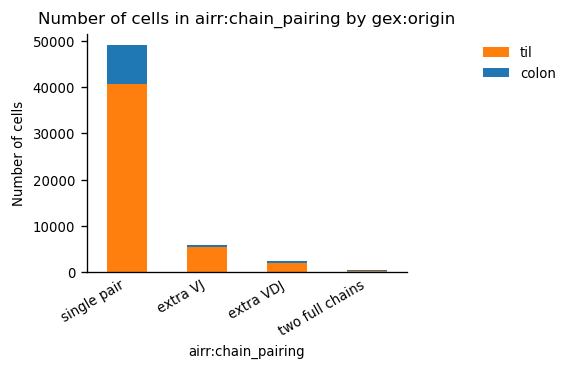

In [84]:
ax = ir.pl.group_abundance(mdata, groupby="airr:chain_pairing", target_col="gex:origin")

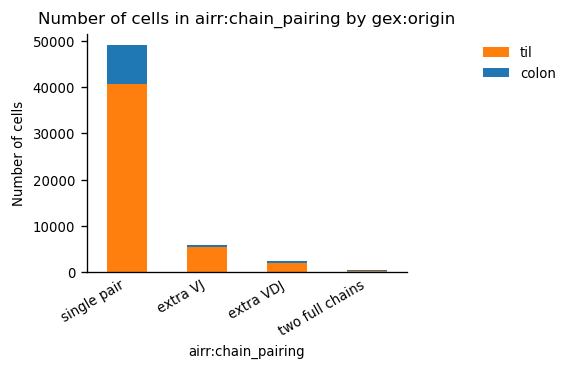

In [85]:
ax = ir.pl.group_abundance(mdata, groupby="airr:chain_pairing", target_col="gex:origin")

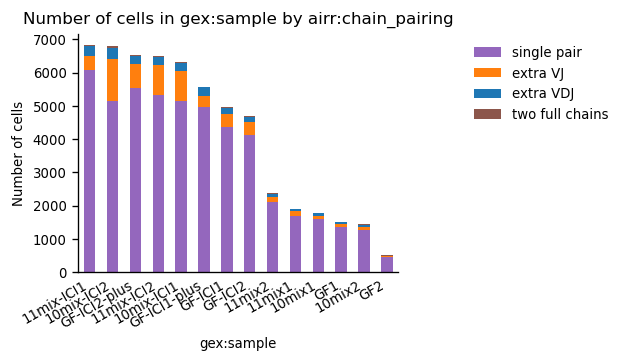

In [86]:
ax = ir.pl.group_abundance(mdata, groupby="gex:sample", target_col="airr:chain_pairing")

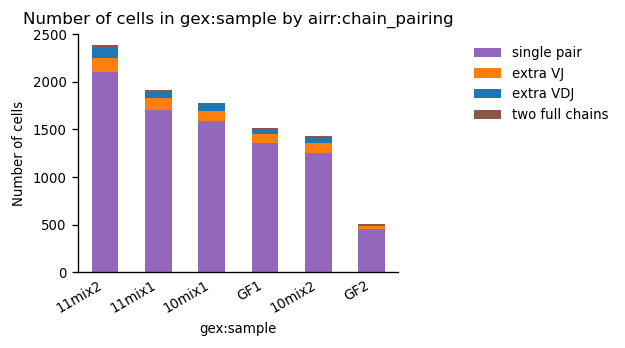

In [87]:
ax = ir.pl.group_abundance(mdata_2019, groupby="gex:sample", target_col="airr:chain_pairing")

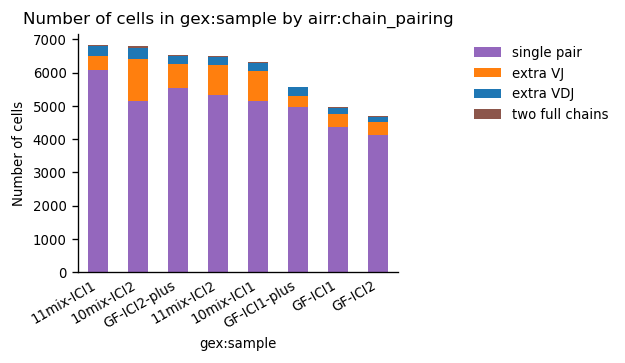

In [88]:
ax = ir.pl.group_abundance(mdata_2021, groupby="gex:sample", target_col="airr:chain_pairing")

In [89]:
mdata

MuData object with n_obs × n_vars = 57749 × 18327
  obs:	'sample', 'group', 'condition'
  2 modalities
    gex:	57749 x 18327
      obs:	'sample', 'group', 'condition', 'n_genes', 'n_counts', 'leiden', 'origin', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'outlier', 'cell_type_coarse'
      var:	'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
      uns:	'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'gex:leiden_colors', 'gex:group_colors', 'gex:origin_colors', 'airr:chain_pairing_colors'
      obsm:	'X_pca', 'X_umap'
      varm:	'PCs'
      obsp:	'distances', 'connectivities'
    airr:	57749 x 0
      obs:	'receptor_type', 'receptor_subtype', 'chain_pairing'
      uns:	'chain_indices'
      obsm:	'airr', 'chain_indices'

In [90]:
mdata_2019

MuData object with n_obs × n_vars = 9522 × 18327
  obs:	'sample', 'group', 'condition'
  2 modalities
    gex:	9522 x 18327
      obs:	'sample', 'group', 'condition', 'n_genes', 'n_counts', 'leiden', 'origin', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'outlier', 'cell_type_coarse'
      var:	'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
      uns:	'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'gex:leiden_colors', 'gex:group_colors', 'gex:origin_colors'
      obsm:	'X_pca', 'X_umap'
      varm:	'PCs'
      obsp:	'distances', 'connectivities'
    airr:	9522 x 0
      obs:	'receptor_type', 'receptor_subtype', 'chain_pairing'
      uns:	'chain_indices'
      obsm:	'airr', 'chain_indices'

In [91]:
mu.pp.intersect_obs(mdata)

In [92]:
# using default parameters, `ir_dist` will compute nucleotide sequence identity
ir.pp.ir_dist(mdata_2019 )

In [ ]:
ir.tl.define_clonotypes(mdata_2019, receptor_arms="all",dual_ir="primary_only")

In [95]:
mdata["airr"].obs

,receptor_type,receptor_subtype,chain_pairing
cell_id,,,
AAACCTGAGTCTTGCA-1_10mix1_0,TCR,TRA+TRB,single pair
AAACCTGCAGGATCGA-1_10mix1_0,TCR,TRA+TRB,single pair
AAACCTGCATACCATG-1_10mix1_0,TCR,TRA+TRB,single pair
AAACCTGCATTGAGCT-1_10mix1_0,TCR,TRA+TRB,single pair
AAACCTGGTGTGCCTG-1_10mix1_0,TCR,TRA+TRB,single pair
...,...,...,...
TTTGTCATCCAGAGGA-1_GF-ICI2-plus_1,TCR,TRA+TRB,extra VJ
TTTGTCATCCCTTGCA-1_GF-ICI2-plus_1,TCR,TRA+TRB,single pair
TTTGTCATCTAACTGG-1_GF-ICI2-plus_1,TCR,TRA+TRB,extra VJ


In [96]:
mdata["airr"].var

""


In [97]:
mdata["gex"]

AnnData object with n_obs × n_vars = 57749 × 18327
    obs: 'sample', 'group', 'condition', 'n_genes', 'n_counts', 'leiden', 'origin', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'outlier', 'cell_type_coarse'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'gex:leiden_colors', 'gex:group_colors', 'gex:origin_colors', 'airr:chain_pairing_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [98]:
sc.pp.neighbors(mdata["airr"])

AttributeError: 'NoneType' object has no attribute 'shape'

In [ ]:
muon.tl.leiden(mdata)
muon.tl.umap(mdata)

In [ ]:
mdata["airr"]

In [ ]:
mdata["gex"]

In [ ]:
sc.pl.umap(mdata["gex"], color="Cxcr3")

In [ ]:
sc.pl.umap(mdata["gex"], color="leiden")

In [ ]:
sc.pl.umap(mdata_2019["gex"], color=["Cxcr3","sample"])

In [ ]:
sc.pl.umap(mdata_2021["gex"], color="Cxcr3")

In [ ]:
mdata_2021

In [ ]:
sc.pl.umap(mdata_2019["gex"], color="sample")

### Compositional analysis

In [ ]:
sample

In [ ]:
adata_tumor = adata_gex_merge[(adata_gex_merge.obs["origin"] == "tumor_primary")] #tumor 

In [ ]:
adata_normal = subset_adata[(subset_adata.obs["origin"] == "normal_adjacent")] #normal
adata_normal = adata_normal[(adata_normal.obs["cell_type_major"] != "Tumor cells")] #normal

In [ ]:
set(frac_by_condition.origin)

In [ ]:
frac_by_condition = (
    adata_gex_merge.obs.groupby(["group", "condition"])
    .apply(lambda x: x.value_counts("sample", normalize=False))
    .reset_index(name="n_cells")
    .assign(condition=lambda x: x["group"].astype(str))
)


In [ ]:
frac_pivot = (
    frac_by_condition.pivot(
        index=["group", "condition"],
        columns="sample",
        values="n_cells",
    )
    .reset_index()
    #.drop(columns="other")
)


In [ ]:
data_all = scc_dat.from_pandas(
    frac_pivot, covariate_columns=["donor_id", "dataset", "sex", "tumor_stage","condition","origin"]
)

In [ ]:
data_all.obs["sex"] = pd.Categorical(
    data_all.obs["sex"], categories=["male", "female"]
)

In [ ]:
data_all._sanitize()

In [ ]:
scc_viz.boxplots(data_all, feature_name="sex", figsize=(12, 5), cmap = "inferno")

#plt.savefig( "figures/cell_proportion_tumor_and_normal_sex.png")


In [ ]:
scc_viz.boxplots(data_all, feature_name="origin", figsize=(12, 5), cmap = "inferno")

#plt.savefig( "figures/cell_proportion_tumor_and_normal_origin.png")


In [ ]:
scc_viz.stacked_barplot(data_all, feature_name="sex", figsize = (3,6))
#plt.savefig( "figures/cell_proportion_tumor_and_normal_sex_barplot.png")

In [ ]:
scc_viz.stacked_barplot(data_all, feature_name="origin", figsize = (3,6))
#plt.savefig( "figures/cell_proportion_tumor_and_normal_origin_barplot.png")

In [ ]:
#############################################################

In [ ]:
# Load in the H5AD data
path = "/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/results/results_by_sample/merge_and_solo_samples"
adata = sc.read_h5ad(
    f"{path}/adata_nodoublet.h5ad"
)


In [ ]:
adata_vdj_10mix1_2019 = ir.io.read_10x_vdj("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2019-10-29_sorted_cd8/analyses_icbi/10mix1/outs/multi/vdj_t/all_contig_annotations.csv")
adata_vdj_10mix2_2019 = ir.io.read_10x_vdj("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2019-10-29_sorted_cd8/analyses_icbi/10mix2/outs/multi/vdj_t/all_contig_annotations.csv")
adata_vdj_11mix1_2019 = ir.io.read_10x_vdj("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2019-10-29_sorted_cd8/analyses_icbi/11mix1/outs/multi/vdj_t/all_contig_annotations.csv")
adata_vdj_11mix2_2019 = ir.io.read_10x_vdj("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2019-10-29_sorted_cd8/analyses_icbi/11mix2/outs/multi/vdj_t/all_contig_annotations.csv")
adata_vdj_GF1_2019 = ir.io.read_10x_vdj("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2019-10-29_sorted_cd8/analyses_icbi/GF1/outs/multi/vdj_t/all_contig_annotations.csv")

############ 2021
adata_vdj_10mix_ICI1_2021 = ir.io.read_10x_vdj("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2021-02-01_sorted_cd8_til/analyses_icbi/10mix-ICI1/outs/multi/vdj_t/all_contig_annotations.csv")
adata_vdj_10mix_ICI2_2021 = ir.io.read_10x_vdj("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2021-02-01_sorted_cd8_til/analyses_icbi/10mix-ICI2/outs/multi/vdj_t/all_contig_annotations.csv")
adata_vdj_11mix_ICI1_2021 = ir.io.read_10x_vdj("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2021-02-01_sorted_cd8_til/analyses_icbi/11mix-ICI1/outs/multi/vdj_t/all_contig_annotations.csv")
adata_vdj_11mix_ICI2_2021 = ir.io.read_10x_vdj("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2021-02-01_sorted_cd8_til/analyses_icbi/11mix-ICI2/outs/multi/vdj_t/all_contig_annotations.csv")
adata_vdj_GF_ICI1_2021 = ir.io.read_10x_vdj("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2021-02-01_sorted_cd8_til/analyses_icbi/GF-ICI1/outs/multi/vdj_t/all_contig_annotations.csv")
adata_vdj_GF_ICI2_2021 = ir.io.read_10x_vdj("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2021-02-01_sorted_cd8_til/analyses_icbi/GF-ICI2/outs/multi/vdj_t/all_contig_annotations.csv")
adata_vdj_GF_ICI1_plus_2021 = ir.io.read_10x_vdj("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2021-02-01_sorted_cd8_til/analyses_icbi/GF-ICI1-plus/outs/multi/vdj_t/all_contig_annotations.csv")
adata_vdj_GF_ICI2_plus_2021 = ir.io.read_10x_vdj("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2021-02-01_sorted_cd8_til/analyses_icbi/GF-ICI2-plus/outs/multi/vdj_t/all_contig_annotations.csv")

In [ ]:
adata_gex_10mix1_2019.obs["sample_id"]="10mix1_2019"
adata_gex_10mix2_2019.obs["sample_id"]="10mix2_2019"
adata_gex_11mix1_2019.obs["sample_id"]="11mix1_2019"
adata_gex_11mix2_2019.obs["sample_id"]="11mix2_2019"
adata_gex_GF1_2019.obs["sample_id"]="GF1_2019"


###############################################
adata_gex_10mix_ICI1_2021.obs["sample_id"]="10mix-ICI1_2021"
adata_gex_10mix_ICI2_2021.obs["sample_id"]="10mix-ICI2_2021"
adata_gex_11mix_ICI1_2021.obs["sample_id"]="11mix-ICI1_2021"
adata_gex_11mix_ICI2_2021.obs["sample_id"]="11mix-ICI2_2021"
adata_gex_GF_ICI1_2021.obs["sample_id"]="GF-ICI1_2021"
adata_gex_GF_ICI2_2021.obs["sample_id"]="GF-ICI2_2021"
adata_gex_GF_ICI1_plus_2021.obs["sample_id"]="GF-ICI1_plus_2021"
adata_gex_GF_ICI2_plus_2021.obs["sample_id"]="GF-ICI2_plus_2021"

In [ ]:
adata_gex_10mix1_2019 =sc.read_10x_mtx("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2019-10-29_sorted_cd8/analyses_icbi/10mix1/outs/per_sample_outs/10mix1/count/sample_filtered_feature_bc_matrix")
adata_gex_10mix2_2019 = sc.read_10x_mtx("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2019-10-29_sorted_cd8/analyses_icbi/10mix2/outs/per_sample_outs/10mix2/count/sample_filtered_feature_bc_matrix")
adata_gex_11mix1_2019 =sc.read_10x_mtx("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2019-10-29_sorted_cd8/analyses_icbi/11mix1/outs/per_sample_outs/11mix1/count/sample_filtered_feature_bc_matrix")
adata_gex_11mix2_2019 = sc.read_10x_mtx("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2019-10-29_sorted_cd8/analyses_icbi/11mix2/outs/per_sample_outs/11mix2/count/sample_filtered_feature_bc_matrix")
adata_gex_GF1_2019 =sc.read_10x_mtx("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2019-10-29_sorted_cd8/analyses_icbi/GF1/outs/per_sample_outs/GF1/count/sample_filtered_feature_bc_matrix")

############ 2021
adata_gex_10mix_ICI1_2021 = sc.read_10x_mtx("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2021-02-01_sorted_cd8_til/analyses_icbi/10mix-ICI1/outs/per_sample_outs/10mix-ICI1/count/sample_filtered_feature_bc_matrix")
adata_gex_10mix_ICI2_2021 =sc.read_10x_mtx("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2021-02-01_sorted_cd8_til/analyses_icbi/10mix-ICI2/outs/per_sample_outs/10mix-ICI2/count/sample_filtered_feature_bc_matrix")
adata_gex_11mix_ICI1_2021 =sc.read_10x_mtx("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2021-02-01_sorted_cd8_til/analyses_icbi/11mix-ICI1/outs/per_sample_outs/11mix-ICI1/count/sample_filtered_feature_bc_matrix")
adata_gex_11mix_ICI2_2021 = sc.read_10x_mtx("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2021-02-01_sorted_cd8_til/analyses_icbi/11mix-ICI2/outs/per_sample_outs/11mix-ICI2/count/sample_filtered_feature_bc_matrix")
adata_gex_GF_ICI1_2021 = sc.read_10x_mtx("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2021-02-01_sorted_cd8_til/analyses_icbi/GF-ICI1/outs/per_sample_outs/GF-ICI1/count/sample_filtered_feature_bc_matrix")
adata_gex_GF_ICI2_2021 = sc.read_10x_mtx("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2021-02-01_sorted_cd8_til/analyses_icbi/GF-ICI2/outs/per_sample_outs/GF-ICI2/count/sample_filtered_feature_bc_matrix")
adata_gex_GF_ICI1_plus_2021 = sc.read_10x_mtx("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2021-02-01_sorted_cd8_til/analyses_icbi/GF-ICI1-plus/outs/per_sample_outs/GF-ICI1-plus/count/sample_filtered_feature_bc_matrix")
adata_gex_GF_ICI2_plus_2021 = sc.read_10x_mtx("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2021-02-01_sorted_cd8_til/analyses_icbi/GF-ICI2-plus/outs/per_sample_outs/GF-ICI2-plus/count/sample_filtered_feature_bc_matrix")

In [ ]:
adata_vdj_list = [adata_vdj_10mix2_2019,adata_vdj_11mix1_2019,adata_vdj_11mix2_2019,adata_vdj_GF1_2019,adata_vdj_10mix_ICI1_2021,adata_vdj_10mix_ICI2_2021,adata_vdj_11mix_ICI1_2021,adata_vdj_11mix_ICI2_2021,adata_vdj_GF_ICI1_2021,adata_vdj_GF_ICI2_2021,adata_vdj_GF_ICI1_plus_2021,adata_vdj_GF_ICI2_plus_2021]

In [ ]:
adata_vdj = adata_vdj_10mix1_2019.concatenate(adata_vdj_list)

In [ ]:
adata_gex_list = [adata_gex_10mix2_2019,adata_gex_11mix1_2019,adata_gex_11mix2_2019,adata_gex_GF1_2019,adata_gex_10mix_ICI1_2021,adata_gex_10mix_ICI2_2021,adata_gex_11mix_ICI1_2021,adata_gex_11mix_ICI2_2021,adata_gex_GF_ICI1_2021,adata_gex_GF_ICI2_2021,adata_gex_GF_ICI1_plus_2021,adata_gex_GF_ICI2_plus_2021]

In [ ]:
adata_gex = adata_gex_10mix1_2019.concatenate(adata_gex_list)

In [ ]:
adata_vdj.write_h5ad("adata_vdj.h5ad")

In [ ]:
adata_gex.write_h5ad("adata_gex.h5ad")

In [ ]:
adata_vdj

In [ ]:
adata_vdj_10mix1_2019

In [ ]:
adata_gex_10mix1_2019  = sc.read_10x_mtx("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/2019-10-29_sorted_cd8/analyses_icbi/10mix1/outs/per_sample_outs/10mix1/count/sample_filtered_feature_bc_matrix")

In [ ]:
adata_vdj_10mix1_2019

In [ ]:
adata_vdj_10mix1_2019.obs

In [ ]:
adata_vdj_10mix1_2019.var

In [ ]:
adata_gex_10mix1_2019

In [ ]:
adata_gex_10mix1_2019.obs

In [ ]:
adata_gex_10mix1_2019.var

In [ ]:
pd.DataFrame([x for x in adata_gex_10mix1_2019.var.index[~adata_gex_10mix1_2019.var.gene_ids.str.contains("ENSMUSG")]], columns=['Antibody'])

In [ ]:
mudata_10mix1_2019 = mu.MuData({"gex": adata_gex_10mix1_2019, "airr": adata_vdj_10mix1_2019})

In [ ]:
mudata_10mix1_2019

In [ ]:
mu.pp.intersect_obs(mudata_10mix1_2019)

In [ ]:
mdata = mudata_10mix1_2019

In [ ]:
sc.pp.filter_genes(mdata["gex"], min_cells=10)
sc.pp.filter_cells(mdata["gex"], min_genes=100)
sc.pp.normalize_total(mdata["gex"])
sc.pp.log1p(mdata["gex"])

# Simplified preprocessing steps:
sc.pp.highly_variable_genes(mdata["gex"], n_top_genes=5000)
sc.tl.pca(mdata["gex"])
sc.pp.neighbors(mdata["gex"])

In [ ]:
mdata["gex"].obs["sample_id"] = "10mix_1_2019"

In [ ]:
mdata.update()

In [ ]:
ir.pp.index_chains(mdata)

In [ ]:
ir.tl.chain_qc(mdata)

_ = ir.pl.group_abundance(
   mdata, groupby="airr:receptor_type", target_col="gex:sample_id"
)

In [ ]:
_ = ir.pl.group_abundance(
    mdata, groupby="airr:receptor_subtype", target_col="gex:sample_id"
)

In [ ]:
mu.pp.filter_obs(mdata, "airr:chain_pairing", lambda x: x != "multichain")

In [ ]:
_ = ir.pl.group_abundance(
    mdata, groupby="airr:chain_pairing", target_col="gex:sample_id"
)

In [ ]:
mu.pp.filter_obs(mdata, "airr:chain_pairing", lambda x: x == "single pair")

In [ ]:
sc.tl.umap(mdata["gex"])
sc.tl.leiden(mdata["gex"])

In [ ]:
mudata_10mix1_2019

In [ ]:
sc.pl.umap(mdata["gex"], color=["leiden"], wspace=0.3)

In [ ]:
ir.pp.ir_dist(mdata, metric='identity', sequence='nt')

In [ ]:
ir.tl.define_clonotypes(mdata, receptor_arms="all", dual_ir="primary_only")

In [ ]:
print(pd.__version__)

In [ ]:
print(sc.__version__)

In [1]:
import pandas as pd